In [2]:
from sympy import Matrix
D=Matrix(4,2,[3,4,2,8,6,9,10,12])
D

Matrix([
[ 3,  4],
[ 2,  8],
[ 6,  9],
[10, 12]])

In [3]:
from sympy import symbols
x,y=symbols('x y',real=True) # 실수 문자 x,y정의
C=D@Matrix(2,1,[x,y])
C

Matrix([
[  3*x + 4*y],
[  2*x + 8*y],
[  6*x + 9*y],
[10*x + 12*y]])

In [4]:
import numpy as np
np.mean(C) # C의 평균출력

21*x/4 + 33*y/4

In [5]:
# C의 분산을 계산하고 간단히 하기
L=np.var(C).simplify()
L

155*x**2/16 + 115*x*y/8 + 131*y**2/16

In [6]:
# 맞는지 다른 방법으로 분산을 구해보면...
E=np.mean(C) # 원래 평균
C2=C.applyfunc(lambda x:x**2) # 각 원소의 제곱
E2=np.mean(C2)
E2-E**2 # 분산구하기

(2*x + 8*y)**2/4 + (3*x + 4*y)**2/4 - (21*x/4 + 33*y/4)**2 + (6*x + 9*y)**2/4 + (10*x + 12*y)**2/4

In [7]:
_.simplify() # 위 셀의 결과를 간단히..

155*x**2/16 + 115*x*y/8 + 131*y**2/16

In [11]:
from sympy import lambdify
ff=lambdify((x,y),L,'numpy')
ff(1,0)

9.6875

In [37]:
from scipy.optimize import minimize # 비선형함수의 최소값을 구하는 함수

def f(x): # 목적함수 정의
    return -ff(x[0],x[1]) #최대값을 구해야 하기 때문에 -ff()로 변환

def eqs(x): # 제약식 정의
    return x[0]**2+x[1]**2-1 # 단위벡터임을 표현

# 제약식이 방정식(eq)형태이며, 어떤 함수로 되어 있는지 정의
cond={'type':'eq','fun':eqs} 

# 함수의 최소값을 구하여 res에 저장
res=minimize(f,[1,1],constraints=cond)
res # 결과값 출력

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -16.164024493293496
       x: [ 7.429e-01  6.694e-01]
     nit: 6
     jac: [-2.402e+01 -2.164e+01]
    nfev: 20
    njev: 6

In [38]:
# 해가 제약식을 만족하는지 확인
res.x[0]**2+res.x[1]**2

1.0000000000098748

In [39]:
# 최대값 구하기
ff(res.x[0],res.x[1])

16.164024493293496

In [50]:
# 칼럼 평균을 구해서 쉽게 계산하도록 데이터프레임으로 변경
import pandas as pd
df=pd.DataFrame(data=np.array(D))
df

,0,1
0,3,4
1,2,8
2,6,9
3,10,12


In [51]:
# 칼럼평균을 구해서 각 칼럼에서 평균치를 뺀 후
# 다시 numpy 어레이로 변경
D1=np.array(df-df.mean(axis=0)).astype(float)

In [52]:
D1

array([[-2.25, -4.25],
       [-3.25, -0.25],
       [ 0.75,  0.75],
       [ 4.75,  3.75]])

In [53]:
C0=D1.T@D1/4
D,P=np.linalg.eig(C0)
D

array([16.16402449,  1.71097551])

In [54]:
P

array([[ 0.74289445, -0.66940857],
       [ 0.66940857,  0.74289445]])

In [55]:
P.T[0] # 첫번째 고유벡터

array([0.74289445, 0.66940857])

In [56]:
ff(_[0],_[1])

16.164024493143298

In [57]:
P.T[1] # 두번째 고유벡터

array([-0.66940857,  0.74289445])

In [58]:
ff(_[0],_[1])

1.7109755068567027

In [61]:
# 원래 데이터를 고유벡터에 의해 변환시켜 보자.
D@P.T

array([[-0.44895093,  4.97980352],
       [-3.86947967,  7.28197275],
       [-1.56731044, 10.70250148],
       [-0.60395835, 15.60881912]])

In [59]:
D=Matrix(4,2,[3,4,2,8,6,9,10,12])
D=np.array(D).astype(int)

# PCA 함수 사용하기

In [65]:
from sympy import Matrix
D=Matrix(4,2,[3,4,2,8,6,9,10,12])
D=np.array(D).astype(int)
D

array([[ 3,  4],
       [ 2,  8],
       [ 6,  9],
       [10, 12]])

In [66]:
df=pd.DataFrame(data=np.array(D))
df=df-df.mean()
D1=np.array(df)
D1 # D의 칼럼평균을 뺀 행렬

array([[-2.25, -4.25],
       [-3.25, -0.25],
       [ 0.75,  0.75],
       [ 4.75,  3.75]])

In [70]:
from sklearn.decomposition import PCA
# n_components=1로 하면 분산이 가장 큰 조합 하나만 출력
pca=PCA(n_components=1) # 객체 설정
pca.fit(D)
pca.components_ # 고유벡터 확인

array([[0.74289445, 0.66940857]])

In [71]:
pca=PCA(n_components=1) # 객체 설정
pca.fit(D1)
pca.components_ # 고유벡터 확인

array([[0.74289445, 0.66940857]])

In [72]:
Matrix(pca.fit_transform(D))

Matrix([
[-4.51649894154896],
[-2.58175910741842],
[ 1.05922726638587],
[ 6.03903078258151]])

In [73]:
Matrix(pca.fit_transform(D1))

Matrix([
[-4.51649894154896],
[-2.58175910741842],
[ 1.05922726638587],
[ 6.03903078258151]])

In [74]:
Matrix(D@pca.components_[0])

Matrix([
[4.90631763673916],
[6.84105747086971],
[ 10.482043844674],
[15.4618473608696]])

In [75]:
Matrix(D1@pca.components_[0])

Matrix([
[-4.51649894154896],
[-2.58175910741842],
[ 1.05922726638587],
[ 6.03903078258151]])

In [76]:
Matrix(D1)

Matrix([
[-2.25, -4.25],
[-3.25, -0.25],
[ 0.75,  0.75],
[ 4.75,  3.75]])

In [77]:
pca.components_

array([[0.74289445, 0.66940857]])

In [88]:
df1=pd.DataFrame(data=np.array(Matrix(D@pca.components_[0])))
df1-df1.mean()

,0
0,-4.51649894154896
1,-2.58175910741842
2,1.05922726638587
3,6.03903078258151


In [80]:
pca=PCA(n_components=2) # 객체 설정
pca.fit(D)
pca.components_ # 고유벡터 확인

array([[ 0.74289445,  0.66940857],
       [-0.66940857,  0.74289445]])

In [81]:
Matrix(pca.transform(D))

Matrix([
[-4.51649894154896,  -1.65113213008139],
[-2.58175910741842,    1.9898542437229],
[ 1.05922726638587, 0.0551144095923595],
[ 6.03903078258151, -0.393836523233877]])

In [63]:
pca.fit_transform(D)

array([[0.74289445, 0.66940857]])

In [65]:
D@pca.components_[0]

array([ 4.90631764,  6.84105747, 10.48204384, 15.46184736])

In [66]:
pca.explained_variance_

array([21.55203266])

In [1]:
# 붓꽃 데이터 읽어들이기
from sklearn.datasets import load_iris
import numpy as np

IR=load_iris() # 데이터 읽어오기
type(IR) # IR 데이터 형식 확인하기

sklearn.utils._bunch.Bunch

In [2]:
IR

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [3]:
import pandas as pd 

df=pd.DataFrame(data=IR['data'],columns=IR['feature_names'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
dtypes: float64(4)
memory usage: 4.8 KB


In [4]:
# 데이터 기본 통계량 보기
df.describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [5]:
# target에는 붓꽃의 품종명이 들어 있음. 
df_Y=pd.DataFrame(IR['target'])
df_Y.value_counts() # 항목별로 몇 개씩 있는지 출력해줌

0    50
1    50
2    50
dtype: int64

In [7]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2) # 4개의 feature를 2개로 줄이고자 하는 설정
pca.fit(df) # PCA 분석 실행
iris_pca = pca.transform(df) # 분석된 결과를 바탕으로 자료 변환수행

In [8]:
pca.components_ # 고유벡터 확인

array([[ 0.36138659, -0.08452251,  0.85667061,  0.3582892 ],
       [ 0.65658877,  0.73016143, -0.17337266, -0.07548102]])

In [10]:
iris_pca.shape # 변환된 결과 확인

(150, 2)

In [20]:
# 모든 분산이 보존되도록 할 경우
pca1 = PCA(n_components=4) # 4개의 feature를 4개 그대로 
pca1.fit(df) # PCA 분석 실행
pca1.explained_variance_ # 고유값 출력

array([4.22824171, 0.24267075, 0.0782095 , 0.02383509])

In [29]:
# 비율로 표시
pca1.explained_variance_ratio_

array([0.92461872, 0.05306648, 0.01710261, 0.00521218])

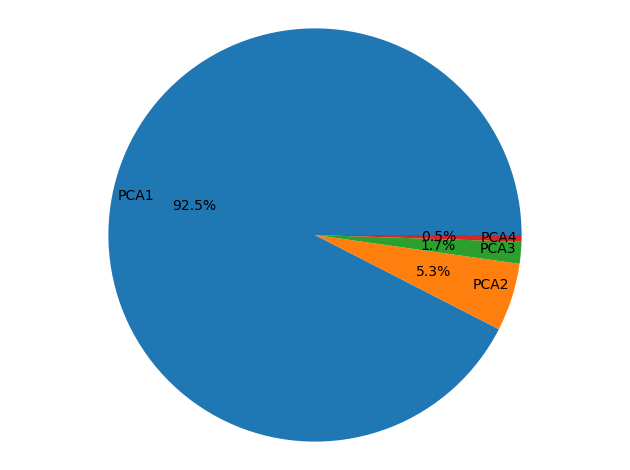

In [28]:
import matplotlib.pyplot as plt

labels=[f'PCA{i}' for i in range(1,5)]
plt.pie(pca1.explained_variance_,
        labels=labels,labeldistance=0.8,autopct='%1.1f%%')

# 차트를 정사각형으로 만들기
plt.axis('equal')

# 레이아웃 자동 조절
plt.tight_layout()

# 플롯 보여주기
plt.show()

In [19]:
# 차원을 줄여서 분산이 어느 정도 줄었는지 확인
pca.explained_variance_

array([4.22824171, 0.24267075])

In [21]:
# 분산의 어느정도를 설명하는지 출력
pca.explained_variance_ratio_

array([0.92461872, 0.05306648])

In [12]:
df.iloc[0,:]@pca.components_[0]

2.818239506639469

In [13]:
df.iloc[0,:]@pca.components_[1]

5.6463498234127965

In [14]:
iris_pca[0]

array([-2.68412563,  0.31939725])

In [15]:
# 칼럼 평균을 빼서 새로운 데이터프레임으로
df1=df-df.mean()

In [16]:
# 첫행의 feature를 첫번째 고유벡터로 재조합
df1.iloc[0,:]@pca.components_[0]

-2.6841256259695365

In [17]:
# 첫행의 feature를 두번째 고유벡터로 재조합
df1.iloc[0,:]@pca.components_[1]

0.31939724658510055

# 이미지의 PCA

In [12]:
file=r'C:\Temp\liberty.jpg'
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
image=Image.open(file) # 파일열기
# 이미지를 NumPy 배열로 변환
image_array = np.array(image)
image_array.shape

(1517, 1084, 3)

데이터의 차원: (1517, 1084)


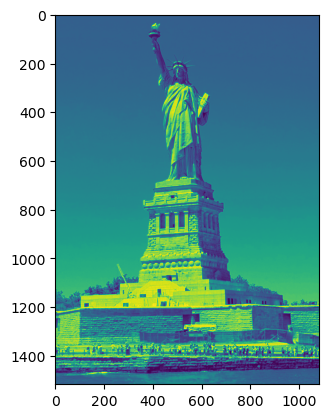

In [4]:
# R 채널 분리
red_channel = np.array(image.getdata(band=0),int)

# numpy 어레이는 이미지 라이브러리와 행,열 역전
red_channel.shape=(image.size[1],image.size[0]) 

print('데이터의 차원:',red_channel.shape)
plt.imshow(red_channel)
plt.show()

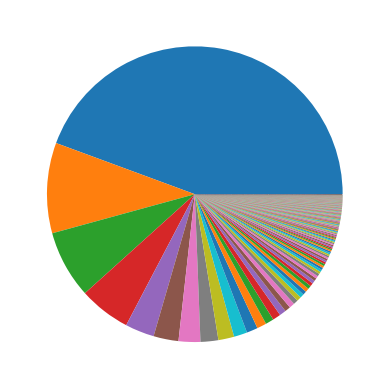

In [5]:
# PCA 분석
from sklearn.decomposition import PCA

pca_red = PCA(n_components=1084)
red_pca = pca_red.fit_transform(red_channel)

# 고유값의 비율 출력
vars=pca_red.explained_variance_ratio_ 
plt.pie(vars) # 원그래프로 표현
plt.show()

In [7]:
# 처음 20개 고유값의 비율 계산
np.sum(vars[:20])

0.881305553719532

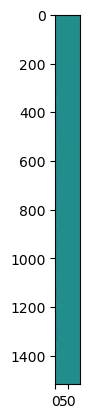

In [14]:
# 주성분 변환된 데이터는 원래 좌표축의 선형결합으로 이미지를 재생할 수 없다. 
plt.imshow(red_pca)
plt.show()

# PCA 역변환

In [3]:
from sympy import Matrix
import numpy as np
A=np.array([[-2.25, -4.25],
       [-3.25, -0.25],
       [ 0.75,  0.75],
       [ 4.75,  3.75]])

In [4]:
Matrix(A)

Matrix([
[-2.25, -4.25],
[-3.25, -0.25],
[ 0.75,  0.75],
[ 4.75,  3.75]])

In [5]:
# 역변환 사용해 보기
pca=PCA(n_components=2) # 객체 설정
out=pca.fit_transform(A)
Matrix(pca.inverse_transform(out))

Matrix([
[-2.25,              -4.25],
[-3.25, -0.250000000000001],
[ 0.75,               0.75],
[ 4.75,               3.75]])

In [6]:
# 역변환 사용해 보기
pca1=PCA(n_components=1) # feature의 개수가 줄어든다면...
out1=pca1.fit_transform(A)
Matrix(pca1.inverse_transform(out1))

Matrix([
[-3.35528200005305, -3.02338310326907],
[ -1.9179745138218, -1.72825167526838],
[0.786894058177515, 0.709055810962867],
[ 4.48636245569734,  4.04257896757459]])

In [11]:
u,s,vt=np.linalg.svd(A) # 원래 행렬 A의 SVD
u,s,vt

(array([[-0.56169061,  0.63114615,  0.11362528,  0.5227308 ],
        [-0.32107831, -0.76062286,  0.05387998,  0.56165695],
        [ 0.13172991, -0.02106751,  0.98988964, -0.04818609],
        [ 0.75103901,  0.15054422, -0.06561061,  0.63950925]]),
 array([8.04090156, 2.61608525]),
 array([[ 0.74289445,  0.66940857],
        [ 0.66940857, -0.74289445]]))

In [12]:
A1=pca1.inverse_transform(out1) # 수정된 행렬 A1
u1,s1,vt1=np.linalg.svd(A1) # A1의 SVD
u1,s1,vt1

(array([[-0.56169061, -0.62273321,  0.12889258,  0.5292388 ],
        [-0.32107831, -0.42612436,  0.01429015, -0.84564918],
        [ 0.13172991,  0.04031834,  0.98901296, -0.05361928],
        [ 0.75103901, -0.65497772, -0.0709638 ,  0.04368897]]),
 array([8.04090156e+00, 2.55583427e-16]),
 array([[ 0.74289445,  0.66940857],
        [ 0.66940857, -0.74289445]]))

In [6]:
pca=PCA(n_components=1) # 객체 설정

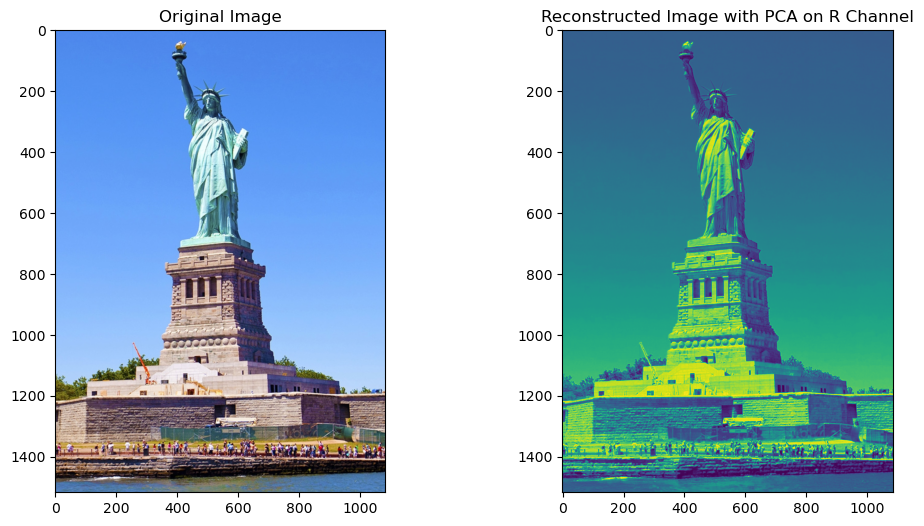

In [7]:
# PCA를 통해 변환된 데이터를 다시 복원
red_reconstructed = pca_red.inverse_transform(red_pca)

# 원래 이미지와 주성분을 이용해 재구성된 이미지 비교
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image_array)
axes[0].set_title("Original Image")
axes[1].imshow(red_reconstructed.astype(np.uint8))
axes[1].set_title("Reconstructed Image with PCA on R Channel")

plt.show()

In [9]:
red_channel.shape

(1517, 1084)

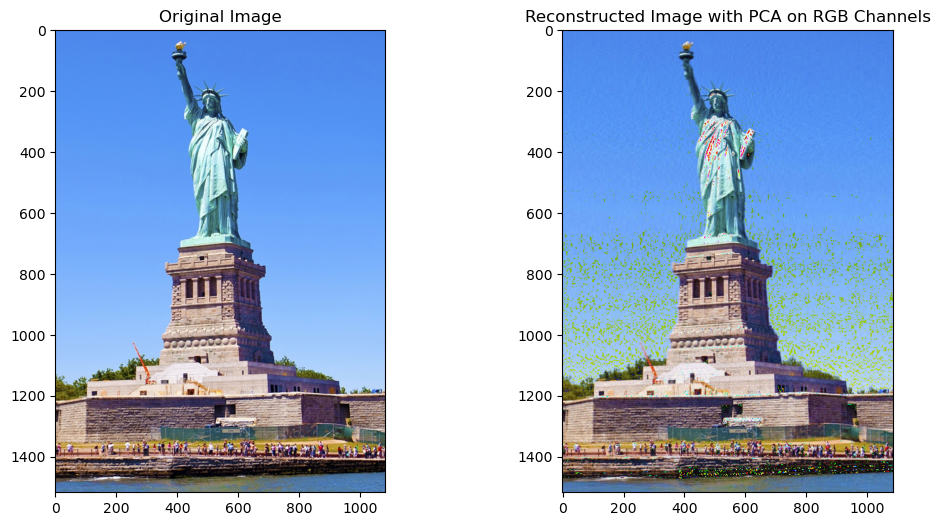

In [11]:
# 이미지를 NumPy 배열로 변환
image_array = np.array(image)

# R, G, B 채널 분리
red_channel = np.array(image.getdata(band=0),int)
red_channel.shape=(image.size[1],image.size[0])
green_channel = np.array(image.getdata(band=1),int)
green_channel.shape=(image.size[1],image.size[0])
blue_channel = np.array(image.getdata(band=2),int)
blue_channel.shape=(image.size[1],image.size[0])

# PCA 적용 (주성분 100개)
pca_red = PCA(n_components=100)
pca_green = PCA(n_components=100)
pca_blue = PCA(n_components=100)

red_pca = pca_red.fit_transform(red_channel)
green_pca = pca_green.fit_transform(green_channel)
blue_pca = pca_blue.fit_transform(blue_channel)

# PCA를 통해 변환된 데이터를 다시 복원
red_reconstructed = pca_red.inverse_transform(red_pca)
green_reconstructed = pca_green.inverse_transform(green_pca)
blue_reconstructed = pca_blue.inverse_transform(blue_pca)

# 이미지 재구성을 위해 shape 조정
red_reconstructed = red_reconstructed.reshape(image_array[:, :, 0].shape)
green_reconstructed = green_reconstructed.reshape(image_array[:, :, 1].shape)
blue_reconstructed = blue_reconstructed.reshape(image_array[:, :, 2].shape)

# 이미지 합치기
image_reconstructed = np.stack([red_reconstructed, 
                                green_reconstructed, 
                                blue_reconstructed], axis=-1)

# 원래 이미지와 주성분을 이용해 재구성된 이미지 비교
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image_array)
axes[0].set_title("Original Image")
axes[1].imshow(image_reconstructed.astype(np.uint8))
axes[1].set_title("Reconstructed Image with PCA on RGB Channels")

plt.show()

# 소리 데이터 변환

In [13]:
from IPython.display import Audio # 소리 듣는 라이브러리
from scipy.io import wavfile # wave 포맷 파일 읽기

# 예제 소리 데이터 로드
file=r'C:\Temp\gettysburg10.wav'

samplerate, voice = wavfile.read(file)

In [20]:
# 소리 데이터 재생하기
Audio(voice,rate=samplerate)

In [27]:
samplerate

22050

In [21]:
import numpy as np
# 소리 데이터를 array 형태로 변환
voice_np=np.array(voice,np.float32)
voice_np.shape

(220568,)

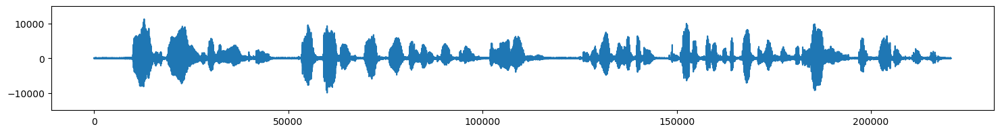

In [26]:
# 소리를 그려보자~
plt.figure(figsize=(18,2))
plt.plot(voice_np)
plt.ylim((-15000,15000))
plt.show()

In [28]:
block_size=516
# 소리 신호가 block_size 로 나누어 떨어질 수 있도록 0의 값을 추가함
samples = len(voice) # voice의 크기
# np.mod(a,b)는 a를 b로 나눈 나머지
# 아래 hanging에는 block_size에서 0으로 만들어야 하는 데이터 개수 계산
hanging = block_size - np.mod(samples, block_size) 
# np.lib.pad()를 이용하여 voice 배열 뒷부분에 0을 추가함
padded = np.lib.pad(voice, (0, hanging), 'constant', constant_values=0)

In [37]:
#나누어 떨어지는지 검증
np.mod(len(padded),block_size)

0

In [40]:
# 데이터롤 2차원으로 reshape
# a // b 는 a를 b로 나눈 몫
reshaped = padded.reshape((len(padded) // block_size, block_size))
reshaped.shape

(428, 516)

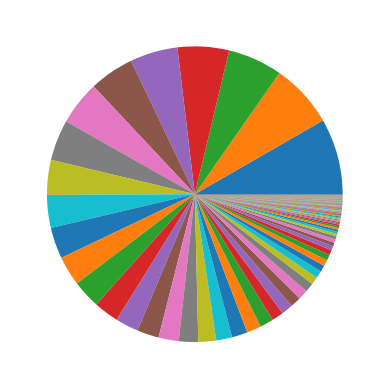

In [47]:
# PCA 분석
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA(n_components=418) # 객체 지정
pca.fit(reshaped) # PCA 분석 수행
# 분산의 분포 보기
plt.pie(pca.explained_variance_ratio_)
plt.show()

In [50]:
# 셜명된 분산의 % 계산
V=np.sum(pca.explained_variance_ratio_[:30])
print('보존된 데이터 분산: ', V)

보존된 데이터 분산:  0.9126292093764892


In [51]:
# 소리 압축과 역변환
pca = PCA(n_components=30)
pca.fit(reshaped)

pca.fit(reshaped)
transformed = pca.transform(reshaped)
# 원래의 데이터 모양으로 역변환 시킴
reconstructed = pca.inverse_transform(transformed).reshape((len(padded)))
# 오디오 재생
Audio(reconstructed, rate=samplerate)

In [52]:
from IPython.display import Audio # 소리 듣는 라이브러리
from scipy.io import wavfile # wave 포맷 파일 읽기

# 예제 소리 데이터 로드
file='C:\Temp\imperialMarch60.wav'

samplerate, voice = wavfile.read(file)

In [53]:
# 소리 데이터 재생하기
Audio(voice,rate=samplerate)

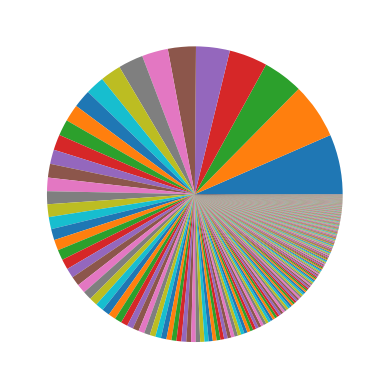

In [55]:
block_size=1024
# 소리 신호가 block_size 로 나누어 떨어질 수 있도록 0의 값을 추가함
samples = len(voice) # voice의 크기
# np.mod(a,b)는 a를 b로 나눈 나머지
# 아래 hanging에는 block_size에서 0으로 만들어야 하는 데이터 개수 계산
hanging = block_size - np.mod(samples, block_size) 
# np.lib.pad()를 이용하여 voice 배열 뒷부분에 0을 추가함
padded = np.lib.pad(voice, (0, hanging), 'constant', constant_values=0)
# 데이터롤 2차원으로 reshape
# a // b 는 a를 b로 나눈 몫
reshaped = padded.reshape((len(padded) // block_size, block_size))
reshaped.shape
# PCA 분석
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA(n_components=418) # 객체 지정
pca.fit(reshaped) # PCA 분석 수행
# 분산의 분포 보기
plt.pie(pca.explained_variance_ratio_)
plt.show()

In [57]:
# 셜명된 분산의 % 계산
V=np.sum(pca.explained_variance_ratio_[:100])
print('보존된 데이터 분산: ', V)

보존된 데이터 분산:  0.8972980953652108


In [58]:
# 소리 압축과 역변환
pca = PCA(n_components=100)
pca.fit(reshaped)

pca.fit(reshaped)
transformed = pca.transform(reshaped)
# 원래의 데이터 모양으로 역변환 시킴
reconstructed = pca.inverse_transform(transformed).reshape((len(padded)))
# 오디오 재생
Audio(reconstructed, rate=samplerate)